In [9]:
!ls -lah tfrecords

total 346M
drwxr-xr-x 2 jetson jetson 152K Aug 19 22:17 .
drwxr-xr-x 6 jetson jetson 100K Aug 19 22:17 ..
-rw-r--r-- 1 jetson jetson    0 Aug 19 21:36 1566275812.365254.tfrecord
-rw-r--r-- 1 jetson jetson    0 Aug 19 21:53 1566276784.508312.tfrecord
-rw-r--r-- 1 jetson jetson 173M Aug 19 22:00 1566277189.046205.tfrecord
-rw-r--r-- 1 jetson jetson 173M Aug 19 22:18 1566278255.238157.tfrecord


In [8]:
import tensorflow as tf
import numpy as np
tf.enable_eager_execution()
import IPython.display as display

filename = 'tfrecords/1566277189.046205.tfrecord'

record_iterator = tf.python_io.tf_record_iterator(path=filename)

raw_image_dataset = tf.data.TFRecordDataset('tfrecords/1566278255.238157.tfrecord')

# Create a dictionary describing the features.
image_feature_description = {
    'timestamp': tf.FixedLenFeature([], tf.float32),
    'image': tf.FixedLenFeature([], tf.string),
    'steering_theta': tf.FixedLenFeature([], tf.float32),
    'accelerator': tf.FixedLenFeature([], tf.float32),
    'height': tf.FixedLenFeature([], tf.int64),
    'width': tf.FixedLenFeature([], tf.int64),
    'capture_height': tf.FixedLenFeature([], tf.int64),
    'capture_width': tf.FixedLenFeature([], tf.int64),
    'capture_fps': tf.FixedLenFeature([], tf.int64),
    'num_channels': tf.FixedLenFeature([], tf.int64)
}

def _parse_image_function(example_proto):
  # Parse the input tf.Example proto using the dictionary above.
  return tf.parse_single_example(example_proto, image_feature_description)

parsed_image_dataset = raw_image_dataset.map(_parse_image_function)
parsed_image_dataset

# for image_features in parsed_image_dataset:
#     image_raw = image_features['image'].numpy()
#     display.display(display.Image(data=image_raw))


<DatasetV1Adapter shapes: {accelerator: (), capture_fps: (), capture_height: (), capture_width: (), height: (), image: (), num_channels: (), steering_theta: (), timestamp: (), width: ()}, types: {accelerator: tf.float32, capture_fps: tf.int64, capture_height: tf.int64, capture_width: tf.int64, height: tf.int64, image: tf.string, num_channels: tf.int64, steering_theta: tf.float32, timestamp: tf.float32, width: tf.int64}>

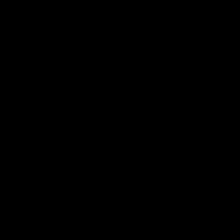

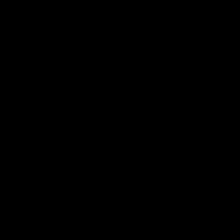

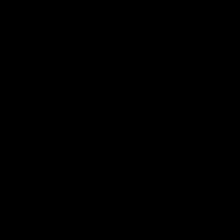

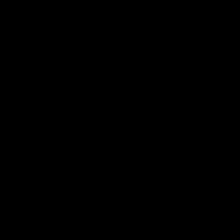

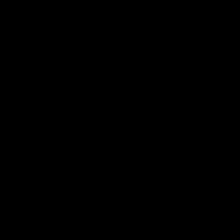

...

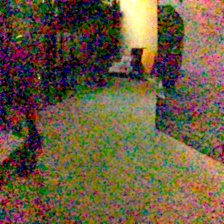

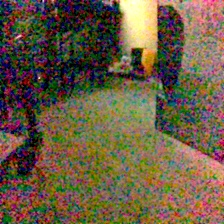

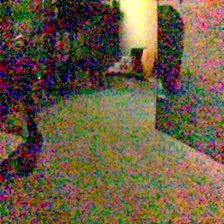

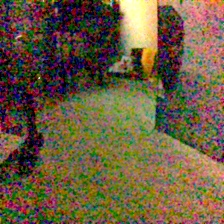

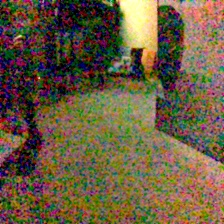

KeyboardInterrupt: 

In [7]:
import cv2
import IPython

for image_features in parsed_image_dataset:
    raw_img = image_features['image'].numpy()
    array_str = np.frombuffer(raw_img, np.uint8).reshape(224, 224, 3)
    _, ret = cv2.imencode('.jpg', array_str)
    i = IPython.display.Image(data=ret)
    IPython.display.display(i)